In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import millify as mil
import warnings
warnings.filterwarnings("ignore")
# from numerize import numerize as num
# house_type_sales["total amount"]= house_type_sales["total amount"].apply(num.numerize) to numerize the number

In [2]:
data = pd.read_parquet("DKHousingPrices.parquet")

In [3]:
data = data[data.year_build >=1970].reset_index(drop=True)
data.sample(10)

,date,quarter,house_id,house_type,sales_type,year_build,purchase_price,%_change_between_offer_and_purchase,no_rooms,sqm,sqm_price,address,zip_code,city,area,region,nom_interest_rate%,dk_ann_infl_rate%,yield_on_mortgage_credit_bonds%
312530,2016-06-30,2016Q2,667922,Villa,regular_sale,2012,2100000,-12.0,5,187.0,11229.946289,Bakkesvinget 34,8963,Auning,East & mid jutland,Jutland,0.00,0.25,2.55
444334,2009-06-21,2009Q2,971798,Apartment,regular_sale,2007,3425000,-10.0,4,120.0,28541.666016,"H.C. Hansens Gade 5, 5. th",2300,København S,"Capital, Copenhagen",Zealand,2.00,1.30,5.50
519604,2005-01-24,2005Q1,1156576,Apartment,regular_sale,1973,4100000,0.0,5,145.0,28275.861328,"Vejlesøparken 12, 3. th",2840,Holte,"Capital, Copenhagen",Zealand,2.00,1.82,4.36
198064,2020-03-17,2020Q1,422905,Villa,regular_sale,1973,1325000,0.0,6,161.0,8229.813477,Bygvej 12,7490,Aulum,South jutland,Jutland,0.00,0.42,1.10
596646,1998-05-24,1998Q2,1364847,Villa,regular_sale,1973,1000000,0.0,4,114.0,8771.929688,Ahornvej 18,5800,Nyborg,Fyn & islands,Fyn & islands,3.50,1.85,6.27
217059,2019-09-25,2019Q3,462534,Villa,regular_sale,1978,2695000,0.0,5,163.0,16533.742188,Rahbeks Have 8,4300,Holbæk,Other islands,Zealand,0.00,0.76,1.35
68157,2022-10-23,2022Q4,143384,Villa,regular_sale,1972,2125000,-15.0,5,152.0,13980.262695,Pomosavej 20,5270,Odense N,Fyn & islands,Fyn & islands,0.65,7.70,3.73
237185,2019-04-09,2019Q2,505168,Apartment,regular_sale,1971,1100000,-2.0,3,83.0,13253.011719,"Kongensgavevej 53, 1. tv",3200,Helsinge,North Zealand,Zealand,0.00,0.76,1.35
212743,2019-10-30,2019Q4,453483,Villa,regular_sale,1975,4075000,0.0,5,170.0,23970.587891,Th. Staunings Vej 61,9210,Aalborg SA,North jutland,Jutland,0.00,0.76,1.35
270663,2018-05-17,2018Q2,577511,Townhouse,regular_sale,2023,1600000,-6.0,2,48.0,33333.332031,Middelfartvej 124A,5200,Odense V,Fyn & islands,Fyn & islands,0.00,0.81,2.12


In [4]:
data.duplicated().sum()

0

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643103 entries, 0 to 643102
Data columns (total 19 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   date                                 643103 non-null  datetime64[ns]
 1   quarter                              643103 non-null  period[Q-DEC] 
 2   house_id                             643103 non-null  int64         
 3   house_type                           643103 non-null  category      
 4   sales_type                           643103 non-null  category      
 5   year_build                           643103 non-null  int16         
 6   purchase_price                       643103 non-null  int32         
 7   %_change_between_offer_and_purchase  643103 non-null  float32       
 8   no_rooms                             643103 non-null  int8          
 9   sqm                                  643102 non-null  float32       
 

In [6]:
data[data["sqm"].isna()]

,date,quarter,house_id,house_type,sales_type,year_build,purchase_price,%_change_between_offer_and_purchase,no_rooms,sqm,sqm_price,address,zip_code,city,area,region,nom_interest_rate%,dk_ann_infl_rate%,yield_on_mortgage_credit_bonds%
488620,2006-08-21,2006Q3,1082137,Summerhouse,regular_sale,1971,995000,0.0,2,NaN,NaN,Fjordengen 12,4300,Holbæk,Other islands,Zealand,2.75,1.92,5.14


In [7]:
#set a query for Summerhouse on the same area, same zip code , same purchase_price range and same room num to get the miss values
zealand_villa = data[(data["region"]== "Zealand") & (data["house_type"]=="Summerhouse") & ( data["purchase_price"] < 1000000) & (data["purchase_price"] > 990000 ) & (data["zip_code"] ==4300) & (data["no_rooms"] == 2)]
zealand_villa[["sqm" , "sqm_price"]].describe().round(3)
# so i will fillna with mean value for sqm 44.000 and sqm_price 23361.641

,sqm,sqm_price
count,2.000,2.000
mean,44.000,23361.641
std,11.314,5977.917
min,36.000,19134.615
25%,40.000,21248.129
50%,44.000,23361.641
75%,48.000,25475.152
max,52.000,27588.666


In [8]:
# data.loc[212845,["sqm" , "sqm_price"]] = 85 , 23077.189
data.loc[488620,["sqm" , "sqm_price"]] = 44.000 , 23361.641

In [9]:
data.iloc[488620]

date                                   2006-08-21 00:00:00
quarter                                             2006Q3
house_id                                           1082137
house_type                                     Summerhouse
sales_type                                    regular_sale
year_build                                            1971
purchase_price                                      995000
%_change_between_offer_and_purchase                    0.0
no_rooms                                                 2
sqm                                                   44.0
sqm_price                                        23361.641
address                                      Fjordengen 12
zip_code                                              4300
city                                                Holbæk
area                                         Other islands
region                                             Zealand
nom_interest_rate%                                    2.

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643103 entries, 0 to 643102
Data columns (total 19 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   date                                 643103 non-null  datetime64[ns]
 1   quarter                              643103 non-null  period[Q-DEC] 
 2   house_id                             643103 non-null  int64         
 3   house_type                           643103 non-null  category      
 4   sales_type                           643103 non-null  category      
 5   year_build                           643103 non-null  int16         
 6   purchase_price                       643103 non-null  int32         
 7   %_change_between_offer_and_purchase  643103 non-null  float32       
 8   no_rooms                             643103 non-null  int8          
 9   sqm                                  643103 non-null  float32       
 

In [11]:
# remove dk_ann_infl_rate% & yield_on_mortgage_credit_bonds% columns from data
data.drop( columns= ["dk_ann_infl_rate%","yield_on_mortgage_credit_bonds%"], inplace=True )

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643103 entries, 0 to 643102
Data columns (total 17 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   date                                 643103 non-null  datetime64[ns]
 1   quarter                              643103 non-null  period[Q-DEC] 
 2   house_id                             643103 non-null  int64         
 3   house_type                           643103 non-null  category      
 4   sales_type                           643103 non-null  category      
 5   year_build                           643103 non-null  int16         
 6   purchase_price                       643103 non-null  int32         
 7   %_change_between_offer_and_purchase  643103 non-null  float32       
 8   no_rooms                             643103 non-null  int8          
 9   sqm                                  643103 non-null  float32       
 

In [13]:
data.sample(8)

,date,quarter,house_id,house_type,sales_type,year_build,purchase_price,%_change_between_offer_and_purchase,no_rooms,sqm,sqm_price,address,zip_code,city,area,region,nom_interest_rate%
362711,2014-07-01,2014Q3,781329,Townhouse,regular_sale,2017,1040000,0.0,4,135.0,7703.703613,Brohaven 35,8362,Hørning,East & mid jutland,Jutland,0.00
500393,2006-01-14,2006Q1,1110277,Townhouse,regular_sale,2008,2150000,0.0,3,100.0,21500.000000,Hjorteleddet 26,3660,Stenløse,North Zealand,Zealand,2.25
397449,2012-07-05,2012Q3,861279,Villa,regular_sale,1979,1875000,-6.0,8,213.0,8802.817383,Blomstertoften 71,7400,Herning,South jutland,Jutland,0.25
313316,2016-06-22,2016Q2,669644,Villa,regular_sale,1973,2400000,0.0,6,147.0,16326.530273,Bymosevej 87,3200,Helsinge,North Zealand,Zealand,0.00
543250,2003-06-28,2003Q2,1215062,Townhouse,regular_sale,1976,1275000,0.0,4,96.0,13281.250000,Hartmannsvej 20,4600,Køge,Other islands,Zealand,2.50
536470,2003-12-11,2003Q4,1198102,Villa,regular_sale,2007,360000,0.0,7,208.0,1730.769287,Fjordvænget 38,7080,Børkop,South jutland,Jutland,2.00
551743,2002-10-21,2002Q4,1237457,Summerhouse,regular_sale,1976,550000,0.0,4,128.0,4296.875000,Grønagervej 14,4200,Slagelse,Other islands,Zealand,3.25
413654,2011-06-07,2011Q2,899849,Apartment,regular_sale,2012,3200000,0.0,3,75.0,42666.667969,"Helga Pedersens Gade 9, 5. 2",8000,Aarhus C,East & mid jutland,Jutland,0.75


In [14]:
# Add a new column for house age
data["house_age"] = data["date"].dt.year-data["year_build"]
data.sample(10)

,date,quarter,house_id,house_type,sales_type,year_build,purchase_price,%_change_between_offer_and_purchase,no_rooms,sqm,sqm_price,address,zip_code,city,area,region,nom_interest_rate%,house_age
406669,2011-11-28,2011Q4,883166,Villa,regular_sale,1979,1575000,-5.0,5,186.0,8467.742188,Landø 63,5683,Haarby,Fyn & islands,Fyn & islands,1.50,32
211604,2019-11-09,2019Q4,451268,Summerhouse,regular_sale,2000,2095000,0.0,4,102.0,20539.214844,Skærbyvangen 20,4500,Nykøbing Sj,Other islands,Zealand,0.00,19
129516,2021-05-19,2021Q2,281777,Farm,regular_sale,2023,1630000,-4.0,6,197.0,8274.111328,Hovedvejen 70,8722,Hedensted,East & mid jutland,Jutland,0.00,-2
235921,2019-04-22,2019Q2,502523,Apartment,regular_sale,1974,400000,0.0,4,117.0,3418.803467,Møllegade 3B,6240,Løgumkloster,South jutland,Jutland,0.00,45
461258,2008-03-09,2008Q1,1014091,Villa,regular_sale,1972,2295000,0.0,5,150.0,15300.000000,Rødsvingel 9,4660,Store Heddinge,Other islands,Zealand,4.00,36
481519,2007-01-23,2007Q1,1063181,Villa,regular_sale,1991,1300000,0.0,5,154.0,8441.558594,Håndværkervænget 9,4000,Roskilde,Other islands,Zealand,3.50,16
99871,2021-12-20,2021Q4,218150,Villa,regular_sale,2022,800000,0.0,5,145.0,5517.241211,Fuglsang AllÃ© 87,7000,Fredericia,South jutland,Jutland,0.00,-1
293068,2017-09-27,2017Q3,625197,Townhouse,regular_sale,2003,2525000,0.0,4,101.0,25000.000000,Ellebæk Parkvej 126,8520,Lystrup,East & mid jutland,Jutland,0.00,14
582741,1999-11-16,1999Q4,1324678,Villa,regular_sale,2000,2641000,0.0,5,174.0,15178.161133,Grønnekildevej 7,4600,Køge,Other islands,Zealand,2.75,-1
97493,2022-01-16,2022Q1,212371,Townhouse,regular_sale,2012,2598000,0.0,4,104.0,24980.769531,Gammelsø Vænge 7D,8260,Viby J,East & mid jutland,Jutland,0.00,10


In [15]:
# data["purchase_year"] = data["date"].dt.year
data

,date,quarter,house_id,house_type,sales_type,year_build,purchase_price,%_change_between_offer_and_purchase,no_rooms,sqm,sqm_price,address,zip_code,city,area,region,nom_interest_rate%,house_age
0,2024-10-26,2024Q4,0,Villa,regular_sale,1974,4350000,0.0,5,215.0,20232.558594,Kildevangen 5,8382,Hinnerup,East & mid jutland,Jutland,3.1,50
1,2024-10-24,2024Q4,14,Villa,regular_sale,1979,3000000,0.0,6,208.0,14423.077148,Vesterled 7,8300,Odder,East & mid jutland,Jutland,3.1,45
2,2024-10-24,2024Q4,23,Villa,regular_sale,2014,4535000,-3.0,6,189.0,23994.708984,Mosevang 10,7300,Jelling,South jutland,Jutland,3.1,10
3,2024-10-24,2024Q4,22,Summerhouse,regular_sale,1979,1100000,-8.0,3,70.0,15714.286133,Rønnebærvænget 3,6094,Hejls,South jutland,Jutland,3.1,45
4,2024-10-24,2024Q4,20,Summerhouse,regular_sale,1979,1070000,-2.0,4,76.0,14078.947266,Olymposvej 23,4200,Slagelse,Other islands,Zealand,3.1,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643098,1992-01-05,1992Q1,1505874,Apartment,regular_sale,1986,426692,0.0,2,61.0,6994.950684,Grønnegården 418,2670,Greve,"Capital, Copenhagen",Zealand,9.5,6
643099,1992-01-05,1992Q1,1505862,Villa,regular_sale,1970,975000,0.0,7,186.0,5241.935547,Margrethe Alle 44,2690,Karlslunde,"Capital, Copenhagen",Zealand,9.5,22
643100,1992-01-05,1992Q1,1505861,Villa,regular_sale,1972,1004000,0.0,6,156.0,6435.897461,Tornekrogen 9,3500,Værløse,North Zealand,Zealand,9.5,20
643101,1992-01-05,1992Q1,1505858,Villa,family_sale,1972,750000,0.0,4,160.0,4687.500000,P O Pedersens Vej 40,7500,Holstebro,South jutland,Jutland,9.5,20


In [16]:
# #set a query for villas on the same area, same purchase_price range and same room num to get the mis vals
# zealand_villa = data[(data["region"]== "Zealand") & (data["house_type"]=="Villa") & ( data["purchase_price"] < 2000000) & (data["purchase_price"] > 1900000 ) & (data["no_rooms"] == 2)]
# zealand_villa[["sqm" , "sqm_price"]].describe().round(3)
# so i will fillna with median value for sqm 85.000 and sqm_price 23077.189

In [17]:
data.sales_type.unique()

['regular_sale', 'other_sale', 'family_sale', 'auction', '-']
Categories (5, object): ['-', 'auction', 'family_sale', 'other_sale', 'regular_sale']

## New df cols will be: 
<div>
<table style="height: 36px;" width="548">
<tbody>
<tr>
<td style="width: 49.4929px;">
<table class="dataframe" style="height: 27px;" border="1" width="1014">
<thead>
<tr>
<th style="width: 35.7783px;">house_id</th>
<th style="width: 73.5731px;">date</th>
<th style="width: 51.7689px;">region</th>
<th style="width: 29.316px;">city</th>
<th style="width: 94.092px;">house_type</th>
<th style="width: 85.9906px;">year_build</th>
<th style="width: 80.908px;">no_rooms</th>
<th style="width: 33.8326px;">sqm</th>
<th style="width: 84.0802px;">sqm_price</th>
<th style="width: 87.7948px;">house_age</th>
<th style="width: 124.045px;">purchase_price</th>
<th style="width: 169.8px;">nom_interest_rate%</th>
</tr>

In [18]:
df = data[["house_id","date","region", "city", "house_type", "year_build", "no_rooms", "sqm" , "sqm_price", "house_age", "purchase_price","nom_interest_rate%"]]

In [19]:
df

,house_id,date,region,city,house_type,year_build,no_rooms,sqm,sqm_price,house_age,purchase_price,nom_interest_rate%
0,0,2024-10-26,Jutland,Hinnerup,Villa,1974,5,215.0,20232.558594,50,4350000,3.1
1,14,2024-10-24,Jutland,Odder,Villa,1979,6,208.0,14423.077148,45,3000000,3.1
2,23,2024-10-24,Jutland,Jelling,Villa,2014,6,189.0,23994.708984,10,4535000,3.1
3,22,2024-10-24,Jutland,Hejls,Summerhouse,1979,3,70.0,15714.286133,45,1100000,3.1
4,20,2024-10-24,Zealand,Slagelse,Summerhouse,1979,4,76.0,14078.947266,45,1070000,3.1
...,...,...,...,...,...,...,...,...,...,...,...,...
643098,1505874,1992-01-05,Zealand,Greve,Apartment,1986,2,61.0,6994.950684,6,426692,9.5
643099,1505862,1992-01-05,Zealand,Karlslunde,Villa,1970,7,186.0,5241.935547,22,975000,9.5
643100,1505861,1992-01-05,Zealand,Værløse,Villa,1972,6,156.0,6435.897461,20,1004000,9.5
643101,1505858,1992-01-05,Jutland,Holstebro,Villa,1972,4,160.0,4687.500000,20,750000,9.5


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643103 entries, 0 to 643102
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   house_id            643103 non-null  int64         
 1   date                643103 non-null  datetime64[ns]
 2   region              643103 non-null  category      
 3   city                643103 non-null  object        
 4   house_type          643103 non-null  category      
 5   year_build          643103 non-null  int16         
 6   no_rooms            643103 non-null  int8          
 7   sqm                 643103 non-null  float32       
 8   sqm_price           643103 non-null  float64       
 9   house_age           643103 non-null  int32         
 10  purchase_price      643103 non-null  int32         
 11  nom_interest_rate%  643103 non-null  float32       
dtypes: category(2), datetime64[ns](1), float32(2), float64(1), int16(1), int32(2), int64(1

<hr />
<h3 style="text-align: center;"><strong>Firstly we need to know what is the house types distribution in each region ?</strong></h3>

In [21]:
# How many house types ??
px.pie(df["house_type"].value_counts(), names= df["house_type"].value_counts().index,values=df["house_type"].value_counts().values, title= "Sold House Types Count ").update_layout(title_x=(0.5))

In [22]:
Regions_sales = df.groupby(["region"])["purchase_price"].agg(["sum", "count"]).sort_values(by="sum" , ascending=False).reset_index()
display(px.bar( Regions_sales , x="region" ,y="sum",text_auto=True , title=("Region Sales Amount") ).update_layout(title_x=0.5))
display(px.bar( Regions_sales , x="region" ,y="count",text_auto=True , title=("Region Sales count") ).update_layout(title_x=0.5))

<div>
<h1>&diams;First Note:</h1>
</div>
<h3>&bull; Jutland ranking as the 1st region by sales count (346 K) and sales amount (580 B), followed by Zealand region with sales count (244 K) and sales amount (572 B).</h3>


In [23]:
#count and sales amount of sold property types by region:
region_house_types_count= df.groupby(["region" , "house_type"])[ "purchase_price"].agg(["count" , "sum"]).sort_values(by="sum", ascending= False).reset_index()
display(px.bar(region_house_types_count, x= "region", y="count" ,color="house_type",text_auto= True, title=("Sold House types Count in each region")).update_layout(title_x=0.5))
display(px.bar(region_house_types_count, x= "region", y="sum" ,color="house_type",text_auto= True,title=("House types total amount in each region")).update_layout(title_x=0.5))

## > What are the Top cites by Sales value and number of sold properties ?

In [24]:
# Number of cities that we have sold in, by region
px.pie(df.groupby("region")["city"].count(),names=df.groupby("region")["city"].count().index,values=df.groupby("region")["city"].count().values, title= "Number of cities by Regions").update_layout(title_x = 0.5)

### * so the Jutland region comes as the first region by cities number, followed by Zealand.

<h3 style="text-align: center;"><strong>Top 20 cities sales amount disterpution</strong></h3>

In [25]:
area_city_sales = df.groupby(["region" ,"city"])["purchase_price"].agg(["count" , "sum"]).sort_values(by="sum",ascending=False).reset_index().head(21).rename(columns={"count" : "prop sold count" , "sum" : "sales amount"})
area_city_sales

,region,city,prop sold count,sales amount
0,Zealand,København S,8540,34361256719
1,Jutland,Silkeborg,8680,20579612995
2,Zealand,Roskilde,6700,18935563753
3,Jutland,Aarhus C,4446,16817343677
4,Jutland,Horsens,8654,16503987725
5,Jutland,Kolding,6242,12581055240
6,Jutland,Herning,7030,12106789815
7,Zealand,Greve,4500,11890760811
8,Jutland,Vejle,5701,11843783871
9,Zealand,København V,2307,11361649468


In [26]:
display(px.bar(area_city_sales , x ="city" , y = "sales amount",text_auto=True , title= "Top 20 cities by sales amount").update_layout(title_x = 0.5))
display(px.bar(area_city_sales , x ="region" , y = "sales amount" , color= "city", barmode="group",text_auto=True , title="Top 20 Cities sales amount by Region").update_layout(title_x = 0.5))

#### 1- As we can see, Top 20 city by total sales amount are located on Zealand and Jutland regions only.
#### 2- Zealand region ranks 1st in terms by  the number of cities with larger shares of top 20 cities total purchase amount by (11cities) followed by Jutland region comes on the 2nd stage by(9 cites).
#### 3- Kobenhavn City is our Star City by around 34 Billion for sales amount.


In [27]:
display(px.bar(area_city_sales , x ="region" , y = "sales amount",text_auto=True,color="city" , title= "Regions of top 20 cities by sales amount").update_layout(title_x = 0.5))
display(px.bar(area_city_sales , x ="region" , y = "prop sold count" ,color="city",text_auto=True, title=" Regions of top 20 cities by sold properties count").update_layout(title_x = 0.5))

#### So, Zealand which has fewer city than Jutland, ranks 1st region by the larger share of top 20 cities total sales amount (9.21 B).

***

## > What is the distripution of house_types by sales amount and count ?

In [28]:
# How many types of sold unites ??
px.pie(df["house_type"].value_counts(), names= df["house_type"].value_counts().index,values=df["house_type"].value_counts().values, title= "Types of sold Houses ").update_layout(title_x=(0.5))

In [29]:
# New table for houses type sales.
house_type_sales = (df.groupby("house_type")["purchase_price"].agg(["count", "sum"]).sort_values(by="sum",ascending=False).reset_index()).rename(columns={"count":"number" , "sum":"total amount"})
house_type_sales

,house_type,number,total amount
0,Villa,340971,635595308743
1,Townhouse,99647,216328899880
2,Apartment,76949,207213649761
3,Summerhouse,114615,141712121393
4,Farm,10921,35269656047


In [30]:
display(px.bar(house_type_sales , x="house_type", y="total amount", text_auto=True, title="House_types Sales Amount").update_layout(title_x=0.5))
display(px.bar(house_type_sales , x="house_type", y="number", text_auto=True, title="House_types Sales Count").update_layout(title_x=0.5))

#### Villas ranks 1st stage by total sales amount and sold property count with around 636B Sales amount and 341K sold property counts, followed by Townhouses on Sales amount with around 216B but it's followed by Summerhouses on sold property counts with around 115K.

In [31]:
#the difrence between Townhouses and Summerhouses on total sales amount and sold properties count

display(print(f"The Townhouses and Summerhouses sold property count Ratio is{house_type_sales[house_type_sales["house_type"]=="Townhouse"]["number"].values / house_type_sales[house_type_sales["house_type"]=="Summerhouse"]["number"].values}"))
display(print(f"The Townhouses and Summerhouses Sales Amount Ratio is {house_type_sales[house_type_sales["house_type"]=="Townhouse"]["total amount"].values / house_type_sales[house_type_sales["house_type"]=="Summerhouse"]["total amount"].values}"))

The Townhouses and Summerhouses sold property count Ratio is[0.86940627]


None

The Townhouses and Summerhouses Sales Amount Ratio is [1.52653773]


None

#### The Townhouses  and Summerhouses sold property count Ratio is (.86) which is less than their Sales Ratio which's (1.5).


In [32]:
#the difrence between villas and apartments on total amount sales and sold property numbers

display(print(f"The villas and apartments sold property Count Ratio is{house_type_sales[house_type_sales["house_type"]=="Villa"]["number"].values / house_type_sales[house_type_sales["house_type"]=="Apartment"]["number"].values}"))
display(print(f"The villas and apartments Sales Amount Ratio is {house_type_sales[house_type_sales["house_type"]=="Villa"]["total amount"].values / house_type_sales[house_type_sales["house_type"]=="Apartment"]["total amount"].values}"))

The villas and apartments sold property Count Ratio is[4.43112971]


None

The villas and apartments Sales Amount Ratio is [3.06734286]


None

#### The villas and apartments sold property count Ratio is (4.4) which is bigger than their Sales Ratio (3.0).
*  This means, (the price of villas is cheaper compared to apartments) OR (the price of apartments is expensive compared to villa).

# what is the top factors affecting on the house types prices ??

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643103 entries, 0 to 643102
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   house_id            643103 non-null  int64         
 1   date                643103 non-null  datetime64[ns]
 2   region              643103 non-null  category      
 3   city                643103 non-null  object        
 4   house_type          643103 non-null  category      
 5   year_build          643103 non-null  int16         
 6   no_rooms            643103 non-null  int8          
 7   sqm                 643103 non-null  float32       
 8   sqm_price           643103 non-null  float64       
 9   house_age           643103 non-null  int32         
 10  purchase_price      643103 non-null  int32         
 11  nom_interest_rate%  643103 non-null  float32       
dtypes: category(2), datetime64[ns](1), float32(2), float64(1), int16(1), int32(2), int64(1

In [89]:
 #creat a new table with (house_type, city, house_age, no_rooms, sqm, sqm_price, purchase_price)
house_types_pricing_factors =df[["house_id","date" ,"house_type" , "region", "city", "house_age" , "no_rooms", "sqm","sqm_price", "nom_interest_rate%", "purchase_price"]]

In [90]:
df["house_age"][df["house_age"]<0].count()

96050


<hr />
<div>
<div>
<h3>&bull; <strong><span style="text-decoration: underline;"><em>Issue</em></span>:</strong> There's some values on house_age column with negative value due to build date is after purchase date.</h3></div><h2 style="text-align: center;"><strong>Create a new df without negative values on house age column</strong></h2>
</div>

In [91]:
house_types_pricing_factors_age = house_types_pricing_factors[house_types_pricing_factors["house_age"] >= 0].reset_index(drop=True)
house_types_pricing_factors_age

,house_id,date,house_type,region,city,house_age,no_rooms,sqm,sqm_price,nom_interest_rate%,purchase_price
0,0,2024-10-26,Villa,Jutland,Hinnerup,50,5,215.0,20232.558594,3.1,4350000
1,14,2024-10-24,Villa,Jutland,Odder,45,6,208.0,14423.077148,3.1,3000000
2,23,2024-10-24,Villa,Jutland,Jelling,10,6,189.0,23994.708984,3.1,4535000
3,22,2024-10-24,Summerhouse,Jutland,Hejls,45,3,70.0,15714.286133,3.1,1100000
4,20,2024-10-24,Summerhouse,Zealand,Slagelse,45,4,76.0,14078.947266,3.1,1070000
...,...,...,...,...,...,...,...,...,...,...,...
547048,1505874,1992-01-05,Apartment,Zealand,Greve,6,2,61.0,6994.950684,9.5,426692
547049,1505862,1992-01-05,Villa,Zealand,Karlslunde,22,7,186.0,5241.935547,9.5,975000
547050,1505861,1992-01-05,Villa,Zealand,Værløse,20,6,156.0,6435.897461,9.5,1004000
547051,1505858,1992-01-05,Villa,Jutland,Holstebro,20,4,160.0,4687.500000,9.5,750000


<hr />
<div>
<h2 style="text-align: center;"><strong>Create a new df for each house type value</strong></h2>
</div>

In [92]:
villa_df = house_types_pricing_factors_age[house_types_pricing_factors_age["house_type"]=="Villa"]
apartment_df=house_types_pricing_factors_age[house_types_pricing_factors_age["house_type"]=="Apartment"]
summerhouse_df=house_types_pricing_factors_age[house_types_pricing_factors_age["house_type"]=="Summerhouse"]
townhouse_df=house_types_pricing_factors_age[house_types_pricing_factors_age["house_type"]=="Townhouse"]
farm_df=house_types_pricing_factors_age[house_types_pricing_factors_age["house_type"]=="Farm"]

 <h1 style="text-align: center;"><strong>Villas Data Disterpution</strong></h1> 

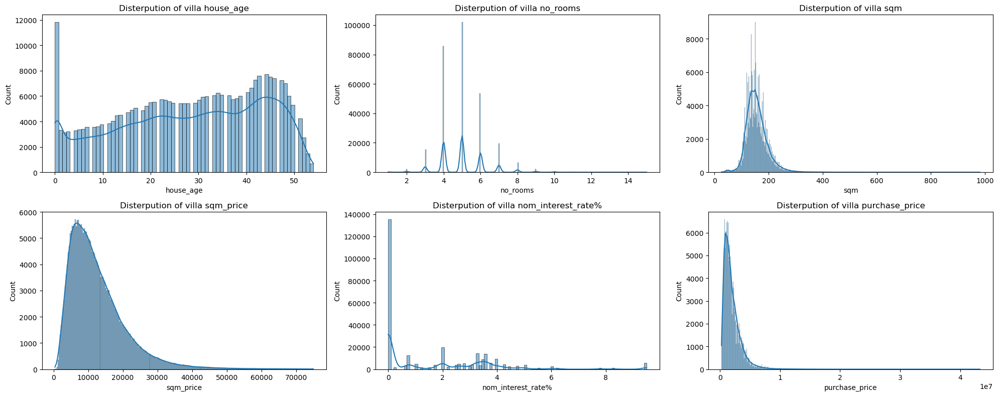

In [93]:
#Numerical data disterpution:
plt.figure(figsize=(20,8))
for e ,i in enumerate(villa_df.columns[5:]) :
    plt.subplot(2,3,e+1)
    plt.title(f"Disterpution of villa {i}")
    sns.histplot(villa_df[i], kde=True)
    plt.tight_layout();

### As we can see, the most of Villas sqm size disterpution is located between 100 to 200 meter.

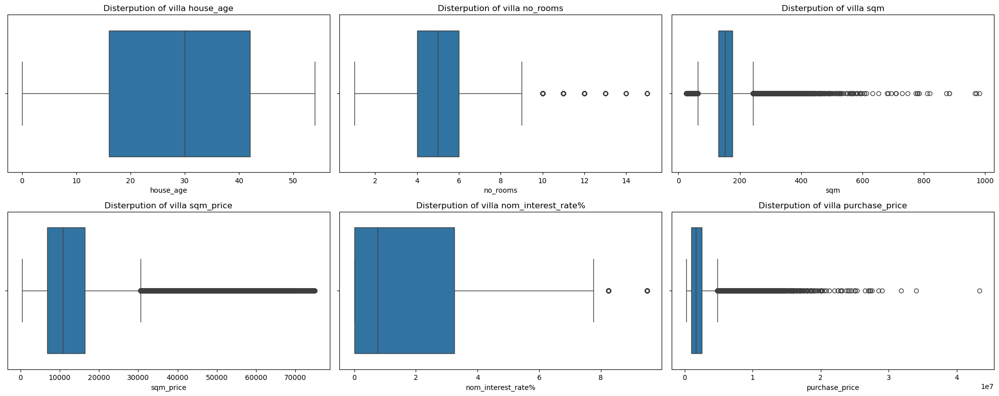

In [94]:
#Numerical data outlyers shape:
plt.figure(figsize=(20,8))
for e ,i in enumerate(villa_df.columns[5:]) :
    plt.subplot(2,3,e+1)
    plt.title(f"Disterpution of villa {i}")
    sns.boxplot(x=villa_df[i])
    plt.tight_layout();

<h2 style="text-align: center;"><strong>correlation coefficient between Villas feature data columns</strong></h2>

In [128]:
#corr_villa is a new df with villa features columns.
corr_villa = villa_df[["house_age","no_rooms","sqm","sqm_price","purchase_price"]]

In [129]:
# sns.pairplot(corr_villa , kind="reg");

<Axes: >

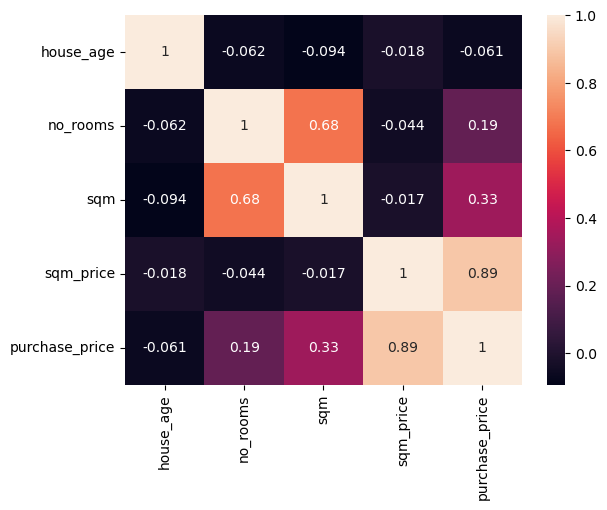

In [130]:
sns.heatmap(corr_villa.corr() , annot=True )

<h2 style="text-align: center;">There is a strong positive correlation between  sqm_price and purchase_price by (0.89)</h2>

<h3>&rarr;So i will check <strong>"sqm price"</strong> for each <strong>"city &amp; region"</strong> to be able to determine which region and which city has high price for Villas sqm.</h3>

In [121]:
display(px.bar(villa_df.groupby(["region"])["sqm_price"].median().sort_values(ascending=False).round(2),text_auto=True,title="Region sqm Avg price for Villas").update_layout(title_x=0.5))
display(px.bar(villa_df.groupby(["region"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="region", y="count", text_auto=True, title="Sold Villas Count per Rgion").update_layout(title_x=0.5))

<h3 style="text-align: justify;">&rArr; Zealand region is ranking as the top region in Villa Avg sqm price by around 14.4K per meter followed by Fyn&amp;Island region by around 10 K per meter.</h3>
<div>

<h3 style="text-align: justify;">&rArr; Jutland region is ranking as the top region in sold Villas count by around 173 K sold units followed by Zealand region by around 88 K sold units.</h3>
<div>

In [99]:
display(px.bar(villa_df.groupby(["city"])["sqm_price"].mean().sort_values(ascending=False).round(2).head(30),text_auto=True,title="City sqm mean price for Villas").update_layout(title_x=(0.5)))
display(px.bar(villa_df.groupby(["city"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="city", y="count", text_auto=True, title="Sold Villas count per Rgion (desc sort by avg sqm price)").update_layout(title_x=0.5))


<h3 style="text-align: justify;"> &rArr; Nordhaven city is ranking as the 1st city in Villa Avg sqm price by around 69K per meter followed by Aarhus city by around 49 K per meter.</h3>
</div>

In [100]:
df["sqm_price"][df["city"] == "Hinnerup"].describe()

count     2461.000000
mean     14711.683983
std       8240.440568
min       1338.912109
25%       8021.390137
50%      14328.704102
75%      20621.468750
max      73214.289062
Name: sqm_price, dtype: float64

In [101]:
df["sqm_price"][df["region"] == "Zealand"].describe()


count    244312.000000
mean      19890.738138
std       13234.897549
min         327.291046
25%       10103.054932
50%       16956.521484
75%       26360.607422
max       75000.000000
Name: sqm_price, dtype: float64

In [102]:
display(px.box(df["sqm_price"][df["city"] == "Hinnerup"], x=df["sqm_price"][df["city"] == "Hinnerup"].values,title="Hinnerup City sqm price outlyers" ).update_layout(title_x=0.5))
display(px.box(df["sqm_price"][df["region"] == "Zealand"], x=df["sqm_price"][df["region"] == "Zealand"].values,title="Zealand Reagion sqm price outlyers").update_layout(title_x=0.5))

 <h1 style="text-align: center;"><strong>Apartments Data Disterpution</strong></h1> 

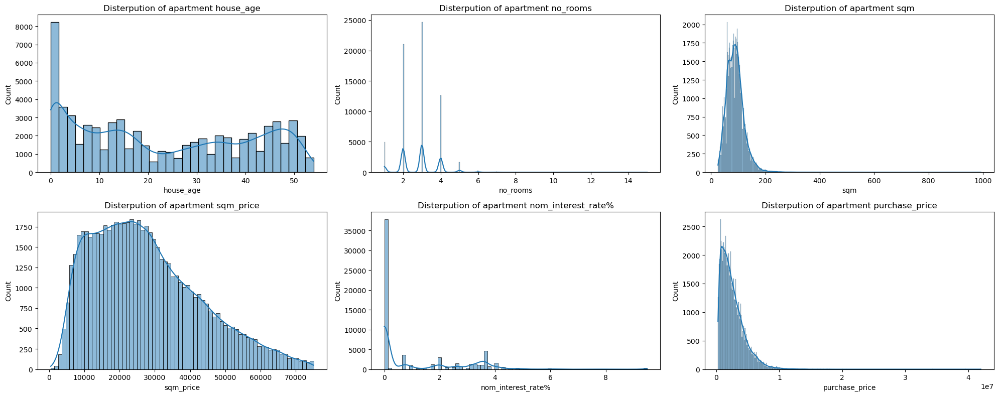

In [103]:
#Numerical data disterpution:
plt.figure(figsize=(20,8))
for e ,i in enumerate(apartment_df.columns[5:]) :
    plt.subplot(2,3,e+1)
    plt.title(f"Disterpution of apartment {i}")
    sns.histplot(apartment_df[i], kde=True)
    plt.tight_layout();

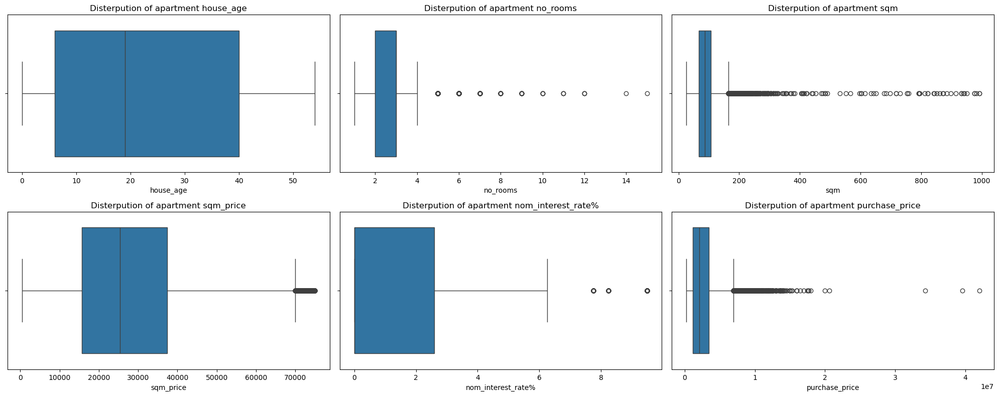

In [104]:
#Numerical data outlyers shape:
plt.figure(figsize=(20,8))
for e ,i in enumerate(apartment_df.columns[5:]) :
    plt.subplot(2,3,e+1)
    plt.title(f"Disterpution of apartment {i}")
    sns.boxplot(x=apartment_df[i])
    plt.tight_layout();

<h2 style="text-align: center;"><strong>correlation coefficient between Apartments feature data columns</strong></h2>

In [125]:
corr_apartment = apartment_df[["house_age","no_rooms","sqm","sqm_price","purchase_price"]]

In [126]:
# sns.pairplot(corr_apartment , kind="reg");

<Axes: >

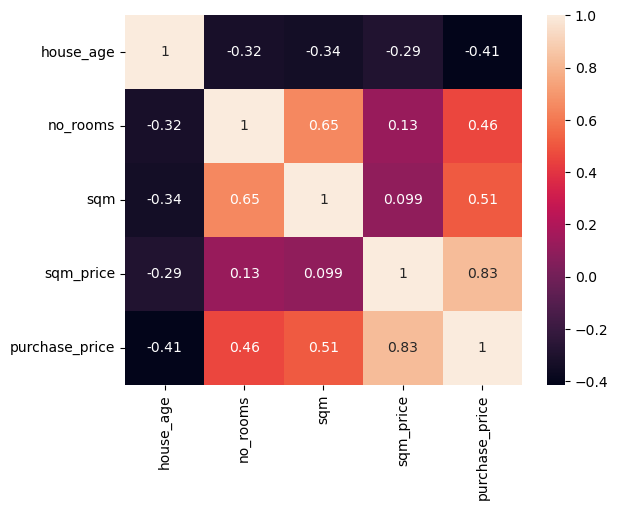

In [127]:
sns.heatmap(corr_apartment.corr() , annot=True)

<p>There is a positive correlation between apartment sqm and purchase_price by (0.51)</p>
<p>There is a moderate positive correlation between apartment no_rooms and purchase_price by (0.46)</p>
<p>There is a moderate negative correlation between house age and purchase_price by (0.41-)</p>
<p>There is a strong positive correlation between apartment sqm_price and purchase_price by (0.83)</p>

<h3>&rarr;So i will check <strong>"sqm price"</strong> for each <strong>"city &amp; region"</strong> to be able to determine which region and which city has high price for Apartments sqm.</h3>

In [108]:
display(px.bar(apartment_df.groupby(["region"])["sqm_price"].median().sort_values(ascending=False).round(2),text_auto=True,title="Region sqm Avg price for apartments").update_layout(title_x=0.5))
display(px.bar(apartment_df.groupby(["region"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="region", y="count", text_auto=True, title="Sold apartments Count per Rgion").update_layout(title_x=0.5))

<h3 style="text-align: justify;">&rArr; Zealand region is ranking as the top region in Apartments Avg sqm price by around 29 K per meter with 41 K sold units count, followed by Jutland region by around 19.3 K per meter with 21 K sold unit count.</h3>
<div>

In [109]:
display(px.bar(apartment_df.groupby(["city"])["sqm_price"].mean().sort_values(ascending=False).round(2).head(30),text_auto=True,title="City sqm mean price for apartments").update_layout(title_x=(0.5)))
display(px.bar(apartment_df.groupby(["city"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="city", y="count", text_auto=True, title="Sold apartments count per Rgion (desc sort by avg sqm price)").update_layout(title_x=0.5))


<h3 style="text-align: justify;"> &rArr; Nordhaven city is ranking as the 1st city in Villa Avg sqm price by around 69K per meter followed by Aarhus city by around 49 K per meter.</h3>
</div>

<hr />
<p>&nbsp;</p>

<h2>&loz; Our question was why the villas and apartments sold property count Ratio is (4.4) which is greater than their sales amount ratio (3.0).</h2>

In [110]:
display(px.bar(villa_df.groupby(["region"])["sqm_price"].median().sort_values(ascending=False).round(2),text_auto=True,title="Region sqm Avg price for Villas").update_layout(title_x=0.5))
display(px.bar(villa_df.groupby(["region"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="region", y="count", text_auto=True, title="Sold Villas Count per Region (desc sort by sqm price)").update_layout(title_x=0.5))
display(px.bar(apartment_df.groupby(["region"])["sqm_price"].median().sort_values(ascending=False).round(2),text_auto=True,title="Region sqm Avg price for apartments").update_layout(title_x=0.5))
display(px.bar(apartment_df.groupby(["region"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="region", y="count", text_auto=True, title="Sold apartments Count per Region (desc sort by sqm price)").update_layout(title_x=0.5))

In [111]:
display(px.bar(villa_df.groupby(["city"])["sqm_price"].mean().sort_values(ascending=False).round(2).head(30),text_auto=True,title="City sqm Avg price for Villas").update_layout(title_x=(0.5)))
display(px.bar(villa_df.groupby(["city"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="city", y="count", text_auto=True, title="Sold Villas count per Region").update_layout(title_x=0.5))
display(px.bar(apartment_df.groupby(["city"])["sqm_price"].mean().sort_values(ascending=False).round(2).head(30),text_auto=True,title="City sqm mean price for apartments").update_layout(title_x=(0.5)))
display(px.bar(apartment_df.groupby(["city"])["sqm_price"].agg(["count","mean"]).sort_values(by="mean",ascending=False).reset_index(), x="city", y="count", text_auto=True, title="Sold apartments count per Rgion").update_layout(title_x=0.5))

<hr />
<p>&nbsp;</p>

<hr />
<p>&nbsp;</p>

<h1 style="text-align: center;"><strong>Our Sales distribution over years</strong></h1>

In [144]:
data.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index()
display(px.line(data.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index() , x= "date", y="sum", title="Sales Amount over years"))
display(px.line(data.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index() , x= "date", y="count",title="Sales Count over years"))

<h3>&radic; As per sales trend line, March 2021 was our peak sale time with around total sales amount 917 M with 335 sold unit count.</h3>
<h3>&radic; We dont have any&nbsp;sales transaction from Dec 2016 till Aug 2017.</h3>

In [145]:
# data["purchase_year"] = data["date"].dt.year
# data[data["purchase_year"]==2017]
data[data["quarter"]=="2017Q2"]
# we do not have any sales during 1st and 2nd Q in 2017. 

,date,quarter,house_id,house_type,sales_type,year_build,purchase_price,%_change_between_offer_and_purchase,no_rooms,sqm,sqm_price,address,zip_code,city,area,region,nom_interest_rate%,house_age


<h1 style="text-align: center;"><strong>Villa Sales distribution over years</strong></h1>

In [146]:
display(px.line(villa_df.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index(), x="date",y="count",title="Sold Villas Count Over Years").update_layout(title_x=0.5))
display(px.line(villa_df.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index(), x="date",y="sum",title="Villa Sales Amount Over Years").update_layout(title_x=0.5))

 <h3>&radic; April 2021 was our peak sale time for Villas with around total sales amount 355 M with 122 sold Villas count.</h3>
<h3>&radic;There was a trend line deviation on April 2012 with around total sales amount 196 M and 105 sold Villas count.</h3>

<h1 style="text-align: center;"><strong>Apartment Sales distribution over years</strong></h1>

In [147]:
display(px.line(apartment_df.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index(), x="date",y="count",title="Sold Apartments Count Over Years").update_layout(title_x=0.5))
display(px.line(apartment_df.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index(), x="date",y="sum",title="Apartment Sales Amount Over Years").update_layout(title_x=0.5))

 <h3>&radic; July 2023 was our peak sale time for Apartments with around total sales amount 366 M with 141 sold Apartments count.</h3>
<h3>&radic;Apartment sales before 2000 were very weak.</h3>

In [148]:
display(px.line(df.groupby(["date"])["nom_interest_rate%"].mean().reset_index(), x="date",y="nom_interest_rate%",title="Interest Rate Trend line").update_layout(title_x=0.5))
display(px.line(data.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index() , x= "date", y="count",title="Sales Count over years").update_layout(title_x=0.5))

<div>
<h2 style="text-align: left;"><strong>&diams; Interest Rate was 0 from Oct 2012 till Sep 2022, which led to an increase in sold units purchases for the same period.</strong></h2>
</div>

In [151]:
# to make sure of nom_interest_rate% valuse

# df["nom_interest_rate%"][df["date"]=="2014-01-01"]
df["nom_interest_rate%"][df["date"]=="2014-05-14"]


365640    0.0
365641    0.0
365642    0.0
365643    0.0
365644    0.0
         ... 
365736    0.0
365737    0.0
365738    0.0
365739    0.0
365740    0.0
Name: nom_interest_rate%, Length: 101, dtype: float32

In [161]:
df.groupby("year_build")["purchase_price"].agg(["sum", "count"]).reset_index()
display(px.line(df.groupby("year_build")["purchase_price"].agg(["sum", "count"]).reset_index() , x="year_build" , y="count" ,title="Count of units built per each year").update_layout(title_x=0.5))
display(px.line(data.groupby(["date"])["purchase_price"].agg(["sum","count"]).reset_index() , x= "date", y="count",title="Sales Count over years").update_layout(title_x=0.5))

 <h3>&radic; 1973 was the peak year for units built with around units built count 37 K.</h3>
  <h3>&radic; The period from 1970 to 1993 is considered the peak period for the number of built units, while the period before 2000 is considered as the lowest in the count of properties sold. .</h3>

